In [1]:
%load_ext autoreload

%autoreload 2

In [1]:
import jax
from jax.config import config
config.update("jax_enable_x64", True)

In [2]:
import scanpy as sc
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import moscot
from moscot.problems.time import TemporalProblem
import moscot.plotting as mpl

In [3]:
adata = sc.read_h5ad("/lustre/groups/ml01/workspace/moscot_paper/pancreas/pancreas_multiome_2022_multiVI_embedding.h5ad")

In [4]:
adata.uns["celltype_colors"] = np.array(['#1f77b4', '#ff7f0e', '#279e68', '#d62728', '#aa40fc', '#8c564b',
       '#e377c2', '#b5bd61', '#17becf', '#aec7e8', '#ffbb78', '#98df8a',
       '#ff9896', '#c5b0d5', '#c49c94', '#f7b6d2'])

In [5]:
endocrine_celltypes = [
    "Ngn3 low",
    "Ngn3 high",
    "Ngn3 high cycling",
    "Fev+",
    "Fev+ Alpha",
    "Fev+ Beta",
    "Fev+ Delta",
    "Epsilon prog.",
    "Alpha",
    "Beta",
    "Delta",
    "Epsilon"
]

In [6]:
def update_celltype(x):
    if x["celltype"] == "Eps/Delta progenitors":
        return "Epsilon prog."
    return x["celltype"]
adata.obs["celltype"] = adata.obs.apply(update_celltype, axis=1)

In [7]:
adata_red = adata[adata.obs["celltype"].isin(endocrine_celltypes)]

In [8]:
adata_red.obs["celltype"] = adata_red.obs["celltype"].astype("category")

/tmp/ipykernel_20132/931441322.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_red.obs["celltype"] = adata_red.obs["celltype"].astype("category")


In [9]:
adata_red.obs['time'] = adata_red.obs.apply(lambda x: 14.5 if x["sample"]=="E14.5" else 15.5, axis=1)

In [10]:
sc.tl.umap(adata_red)

/home/icb/dominik.klein/miniconda3/envs/jax_gpu2/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [11]:
adata_red.obs["celltype"].cat.categories

Index(['Alpha', 'Beta', 'Delta', 'Epsilon', 'Epsilon prog.', 'Fev+',
       'Fev+ Alpha', 'Fev+ Beta', 'Fev+ Delta', 'Ngn3 high',
       'Ngn3 high cycling', 'Ngn3 low'],
      dtype='object')

In [12]:
adata_red.uns["celltype_colors"] = ['#1f77b4',
 '#ff7f0e',
 '#279e68',
 '#8c564b',
 '#aa40fc',
 '#e377c2',
 '#b5bd61',
 '#17becf',
 '#aec7e8',
 '#ff9896',
 '#c5b0d5',
 '#c49c94']

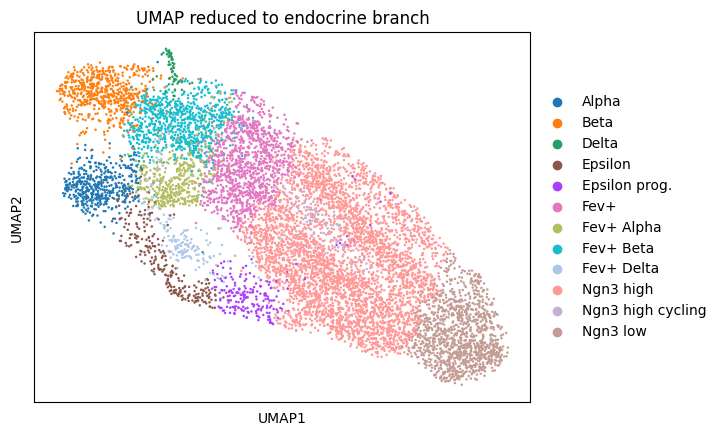

In [13]:
sc.pl.umap(adata_red, color="celltype", title="UMAP reduced to endocrine branch")

# MultiVI space

In [14]:
tp0 = TemporalProblem(adata_red)
tp0 = tp0.score_genes_for_marginals(gene_set_proliferation="mouse", gene_set_apoptosis="mouse")
tp0 = tp0.prepare("time", joint_attr="X_multi_vi")

/home/icb/dominik.klein/miniconda3/envs/jax_gpu2/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


/home/icb/dominik.klein/miniconda3/envs/jax_gpu2/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


In [15]:
tp0 = tp0.solve(epsilon=1e-3, scale_cost="mean", max_iterations=1e5)

/home/icb/dominik.klein/git_repos/moscot/moscot/solvers/_base_solver.py:159: UserWarning: Solver did not converge
  warnings.warn("Solver did not converge")


In [58]:
ct_desc = tp0.cell_transition(source=14.5, target=15.5, source_groups="celltype", target_groups="celltype", forward=True)

In [59]:
tm = adata_red.uns["moscot_results"]["cell_transition"]["cell_transition"]["transition_matrix"]

In [60]:
order = ['Alpha', 'Beta', 'Delta', 'Epsilon', 'Epsilon prog.', 'Fev+',
       'Fev+ Alpha', 'Fev+ Beta', 'Fev+ Delta', 'Ngn3 high',
       'Ngn3 high cycling', 'Ngn3 low']

In [61]:
tm = tm[order]


In [62]:
tm = tm.transpose()
tm = tm[order]
tm = tm.transpose()

In [63]:
tm = tm[::-1]

In [64]:
adata_red.uns["moscot_results"]["cell_transition"]["cell_transition"]["transition_matrix"] = tm

In [68]:
output_dir = "/lustre/groups/ml01/workspace/moscot_paper/figures/"
import os

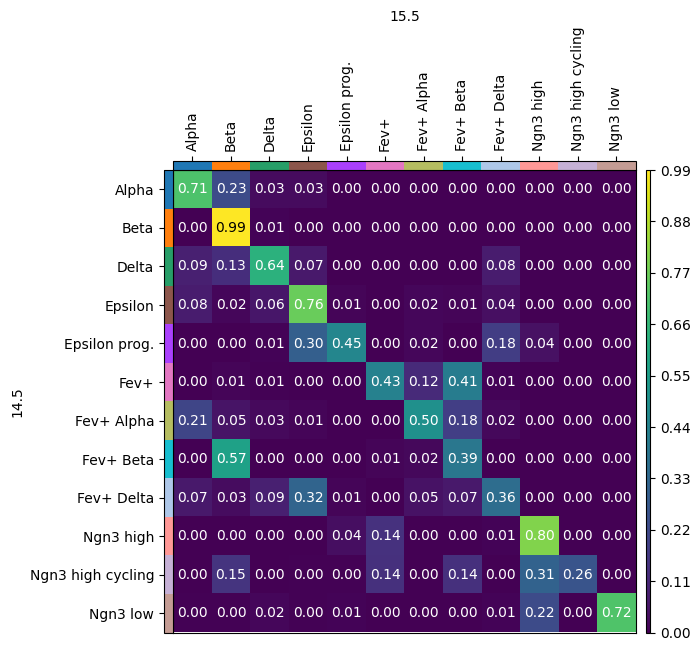

In [72]:
mpl.cell_transition(tp0, dpi=100, fontsize=10)

In [73]:
ct_desc = tp0.cell_transition(source=14.5, target=15.5, source_groups="celltype", target_groups="celltype", forward=False)

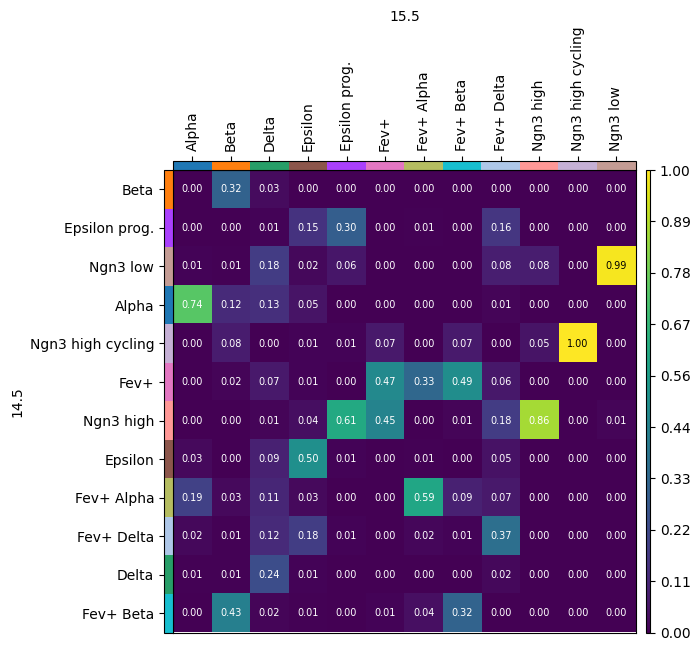

In [74]:
mpl.cell_transition(tp0, dpi=100, fontsize=7)

In [75]:
tp0.push(14.5, 15.5, data="celltype", subset="Epsilon prog.")

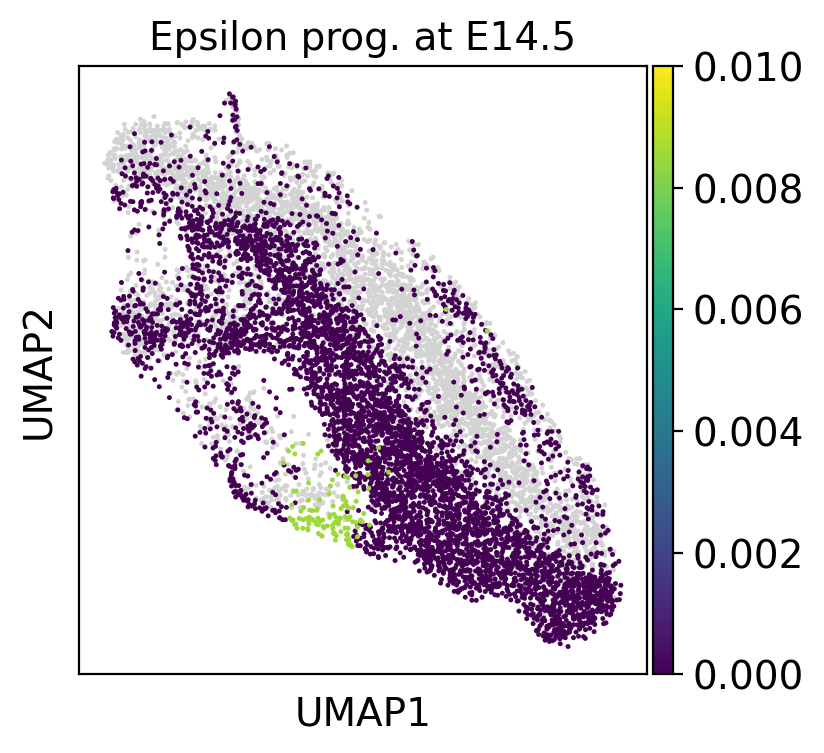

In [97]:
mpl.push(tp0, time_points=[14.5], title="Epsilon prog. at E14.5", vmin=0, vmax=0.01)#cbar_kwargs={"vmin":0, "vmax":0.01})

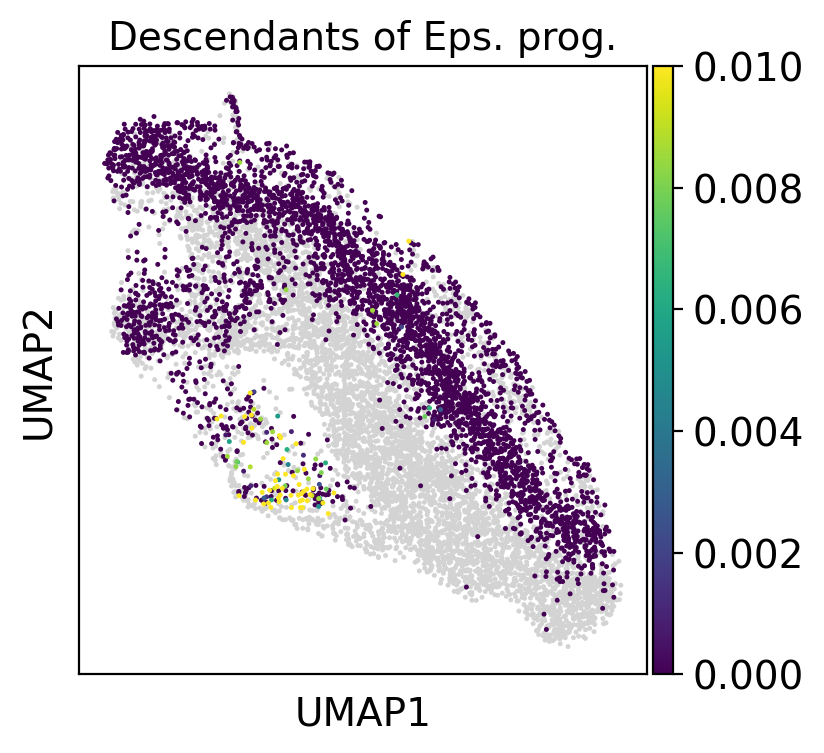

In [99]:
mpl.push(tp0, time_points=[15.5], vmin=0, vmax=0.01, title="Descendants of Eps. prog.")

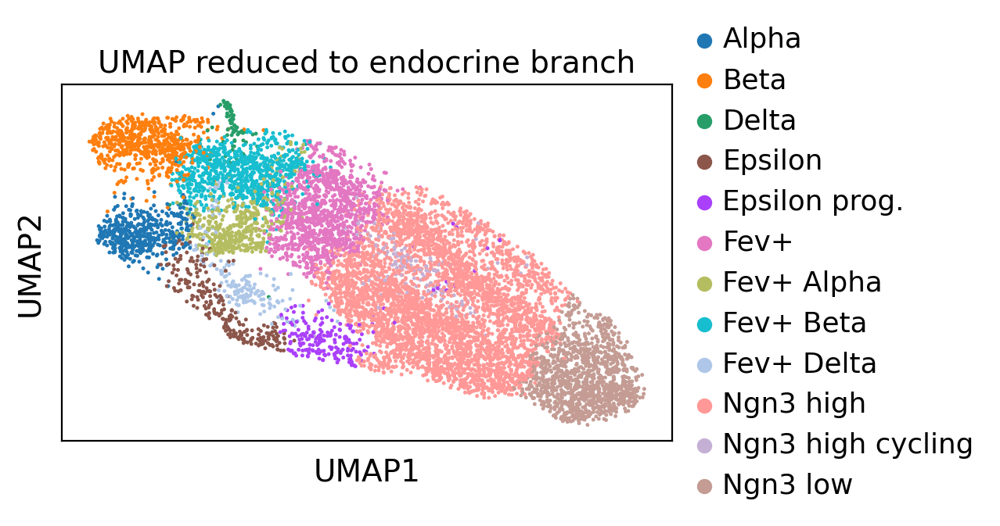

In [107]:
sc.pl.umap(adata_red, color="celltype", title="UMAP reduced to endocrine branch")

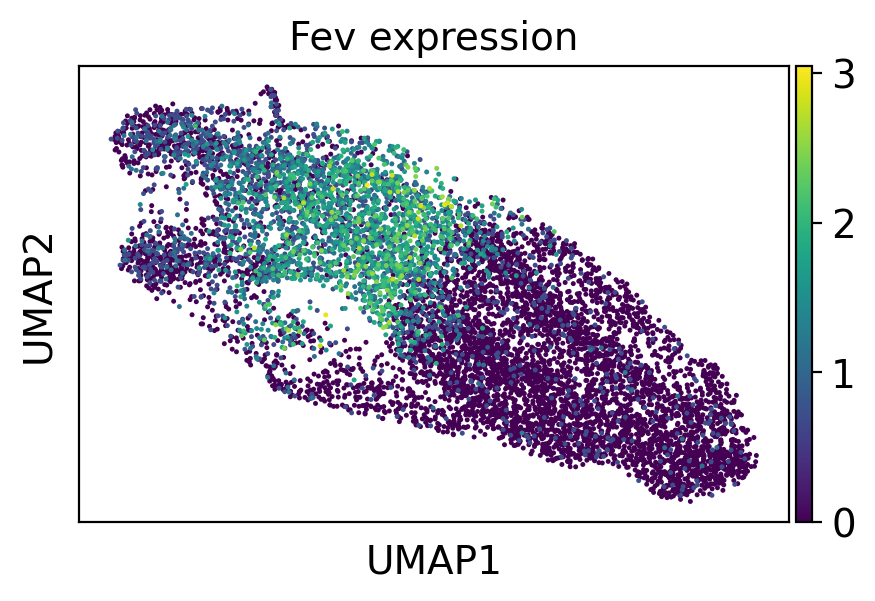

In [126]:
sc.pl.umap(adata_red, color="Fev", title="Fev expression")

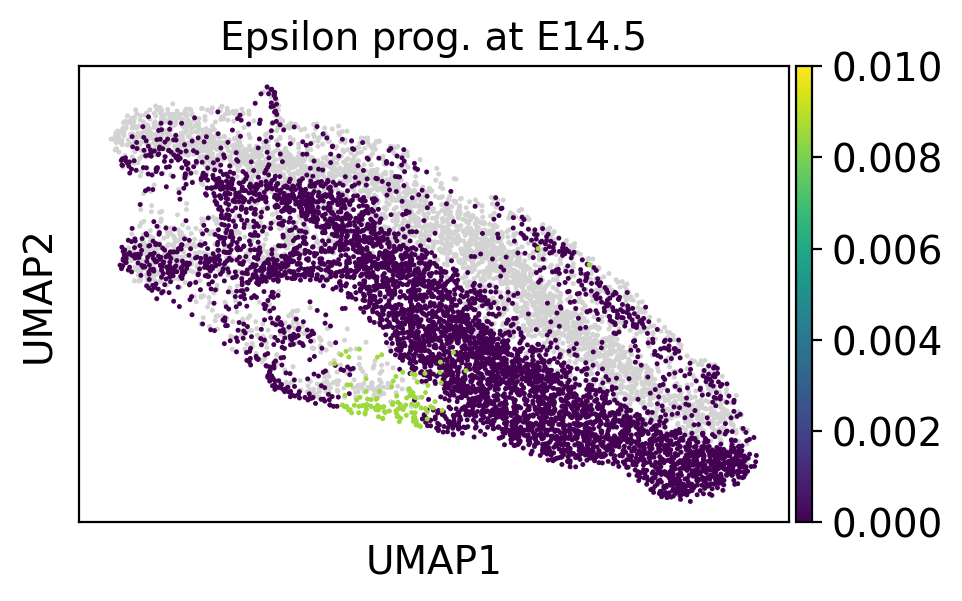

In [114]:
mpl.push(tp0, time_points=[14.5], title="Epsilon prog. at E14.5", vmin=0, vmax=0.01, figsize=(5,3))#cbar_kwargs={"vmin":0, "vmax":0.01})

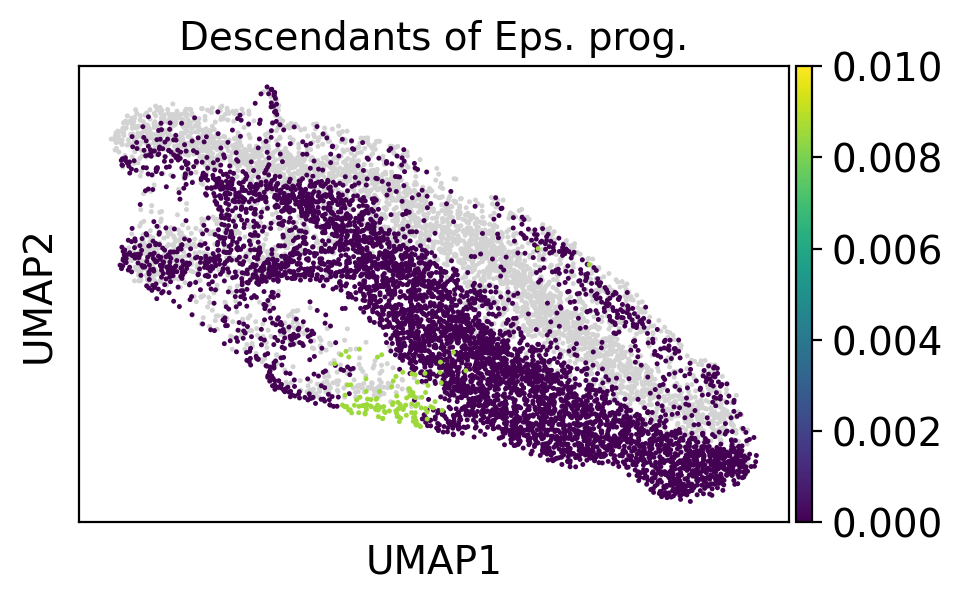

In [112]:
mpl.push(tp0, time_points=[14.5], dpi=100, vmin=0, vmax=0.01, figsize=(5,3), title="Descendants of Eps. prog.")

In [121]:
tp0.pull(14.5, 15.5, data="celltype", subset="Epsilon")

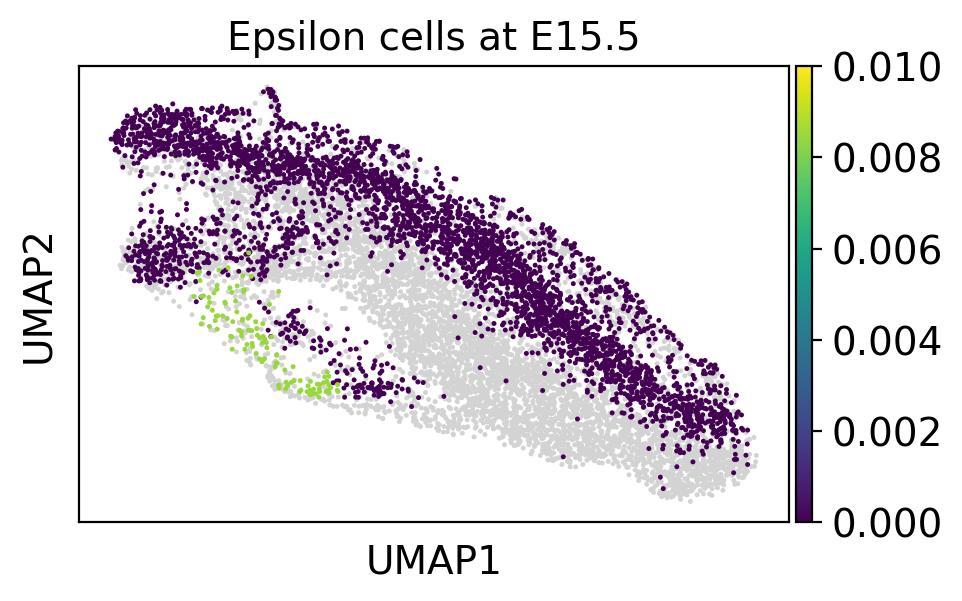

In [124]:
mpl.pull(tp0, time_points=[15.5], dpi=100, vmin=0, vmax=0.01, figsize=(5,3), title="Epsilon cells at E15.5")

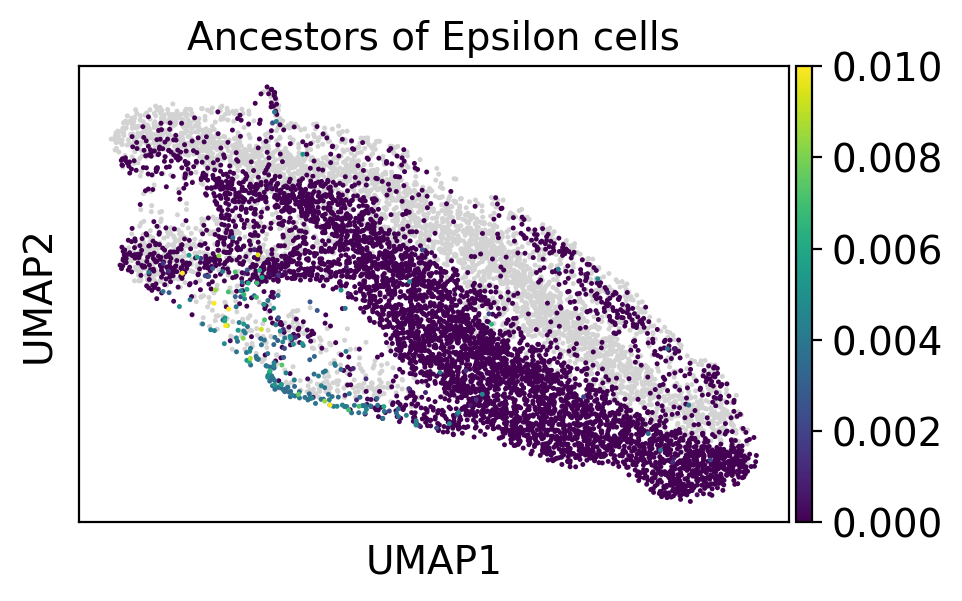

In [125]:
mpl.pull(tp0, time_points=[14.5], dpi=100, vmin=0, vmax=0.01, figsize=(5,3), title="Ancestors of Epsilon cells")

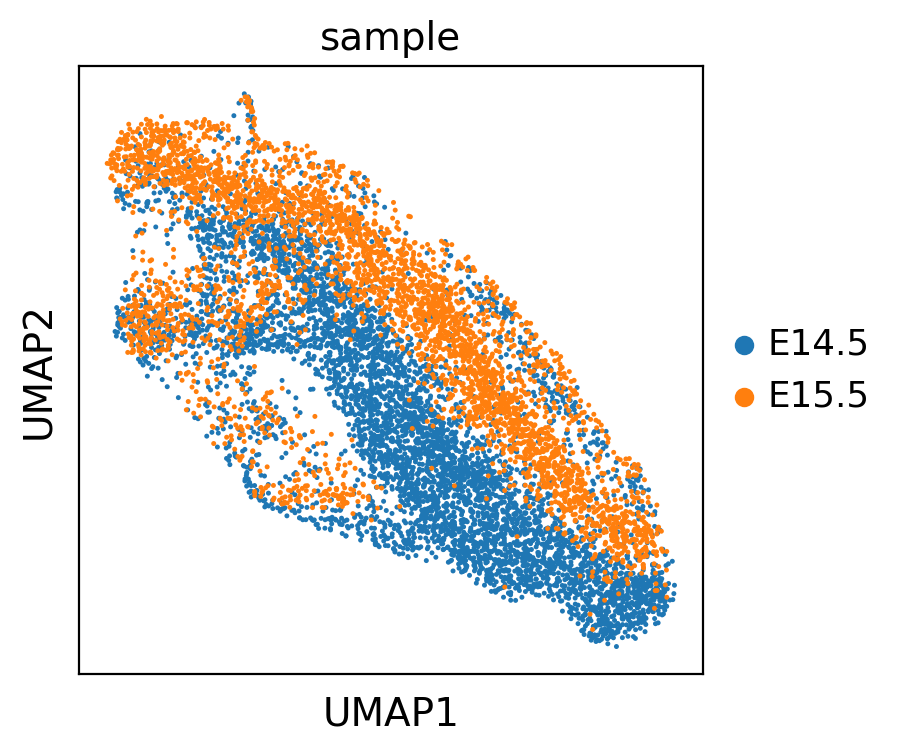

In [78]:
sc.pl.umap(adata_red, color="sample")

In [82]:
adata_red.obs["push"].sum()

1.9999999999973013

In [83]:
adata_red[adata_red.obs["time"]==14.5].obs["push"].sum()

1.0

In [84]:
adata_red[adata_red.obs["time"]==15.5].obs["push"].sum()

0.9999999999973009

In [88]:
adata_red.obs.groupby("time").count()

,batch_id,modality,_scvi_batch,celltype,sample,proliferation,apoptosis,push,plot_push
time,,,,,,,,,
14.5,5539,5539,5539,5539,5539,5539,5539,5539,0
15.5,3826,3826,3826,3826,3826,3826,3826,3826,3826


In [79]:
tp0.push(14.5, 15.5, data="celltype_refined", subset="Eps/Delta progenitors,1")

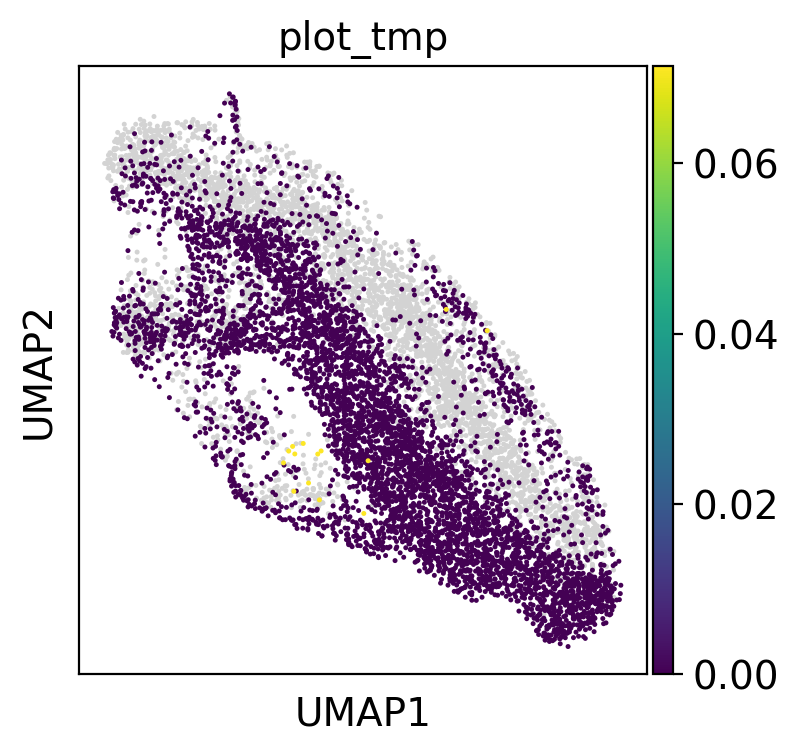

In [80]:
mpl.push(tp0, time_points=[14.5])

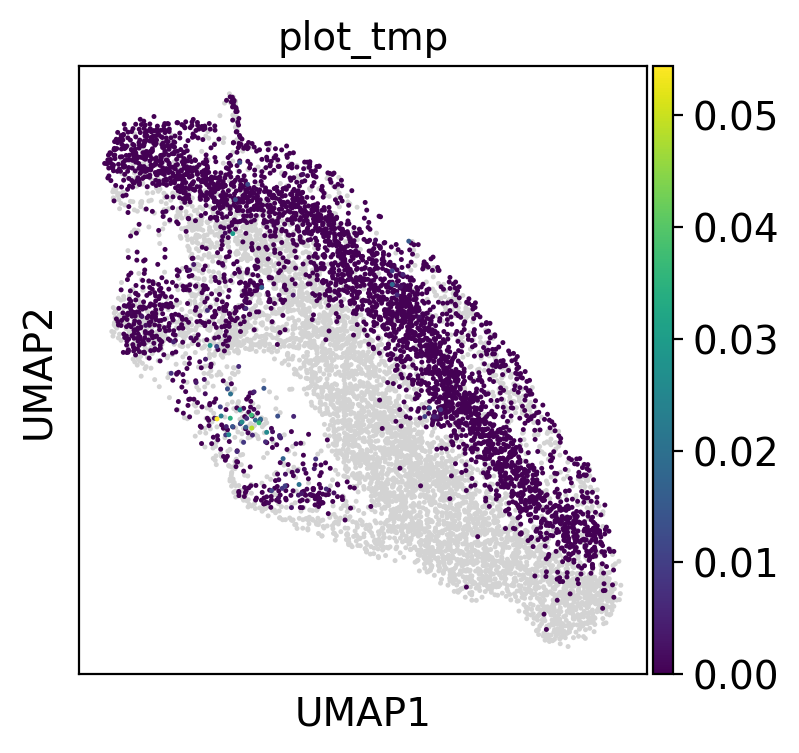

In [81]:
mpl.push(tp0, time_points=[15.5])

In [82]:
tp0.pull(14.5, 15.5, data="celltype_refined", subset="Epsilon")

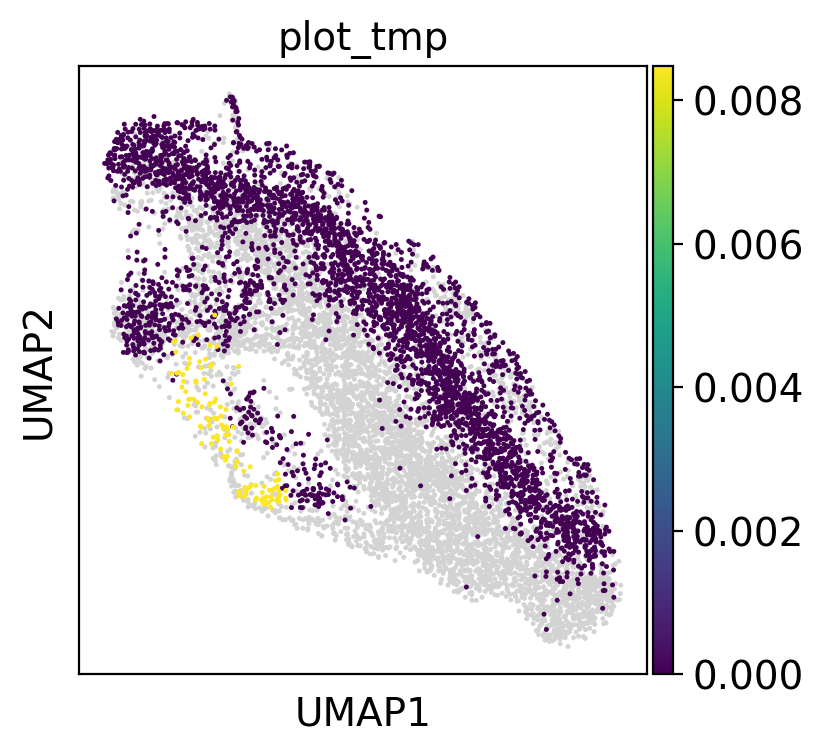

In [85]:
mpl.pull(tp0, time_points=[15.5])

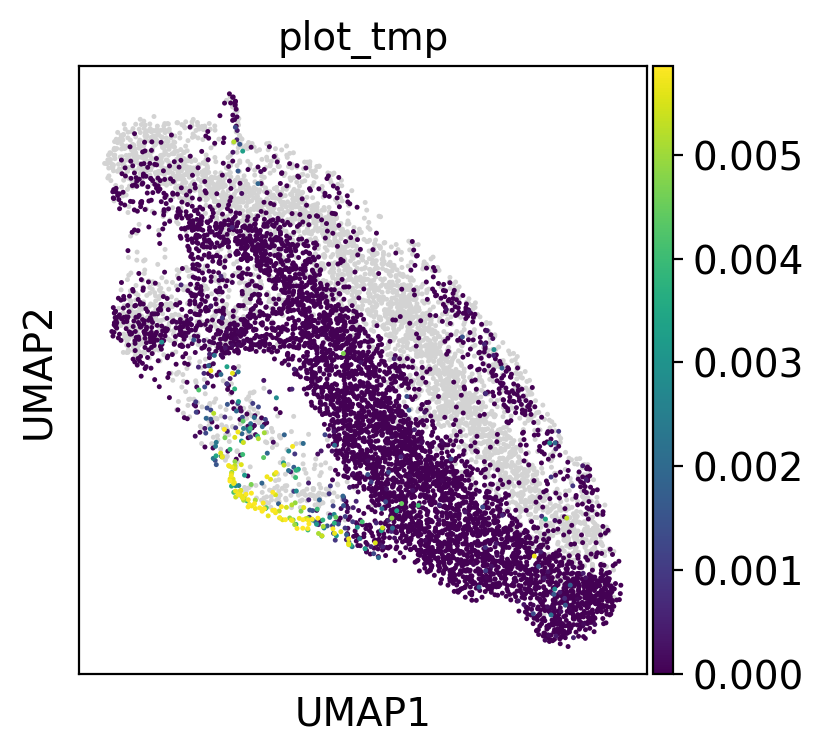

In [83]:
mpl.pull(tp0, time_points=[14.5])

In [86]:
tp0.pull(14.5, 15.5, data="celltype_refined", subset="Delta")

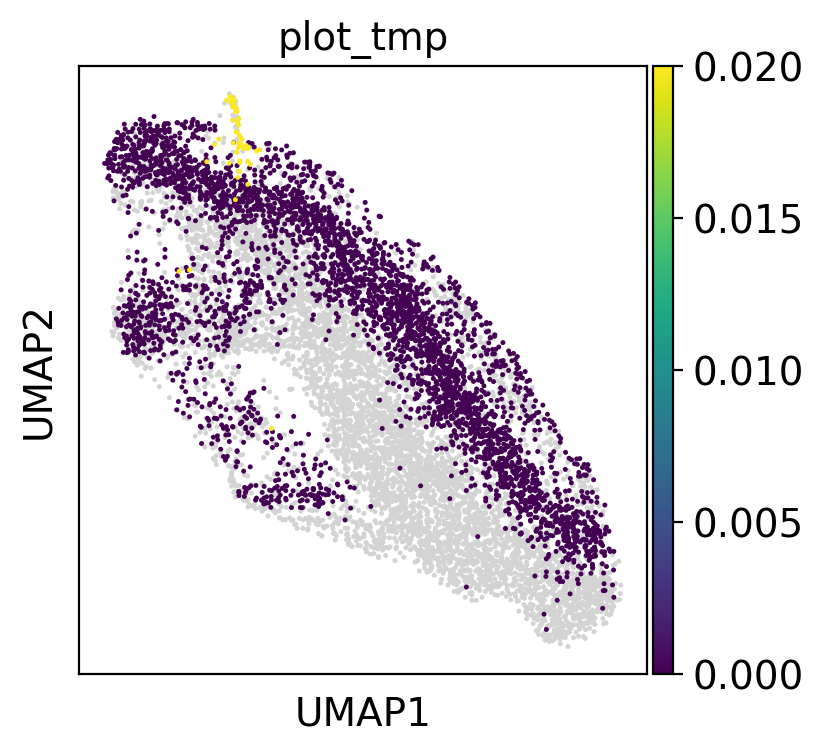

In [87]:
mpl.pull(tp0, time_points=[15.5])

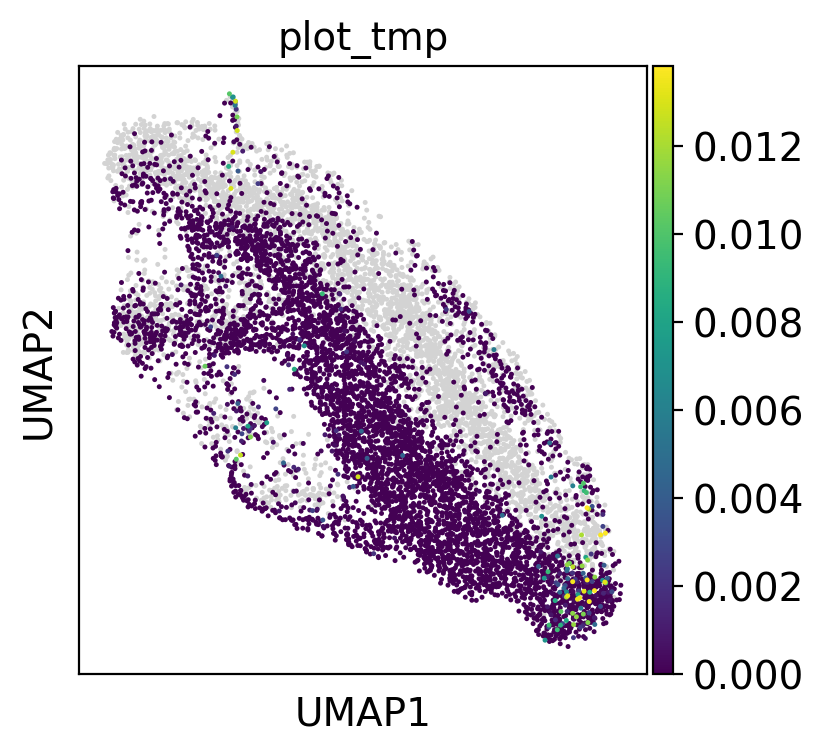

In [88]:
mpl.pull(tp0, time_points=[14.5])

In [89]:
tp0.pull(14.5, 15.5, data="celltype_refined", subset="Fev+ Delta")

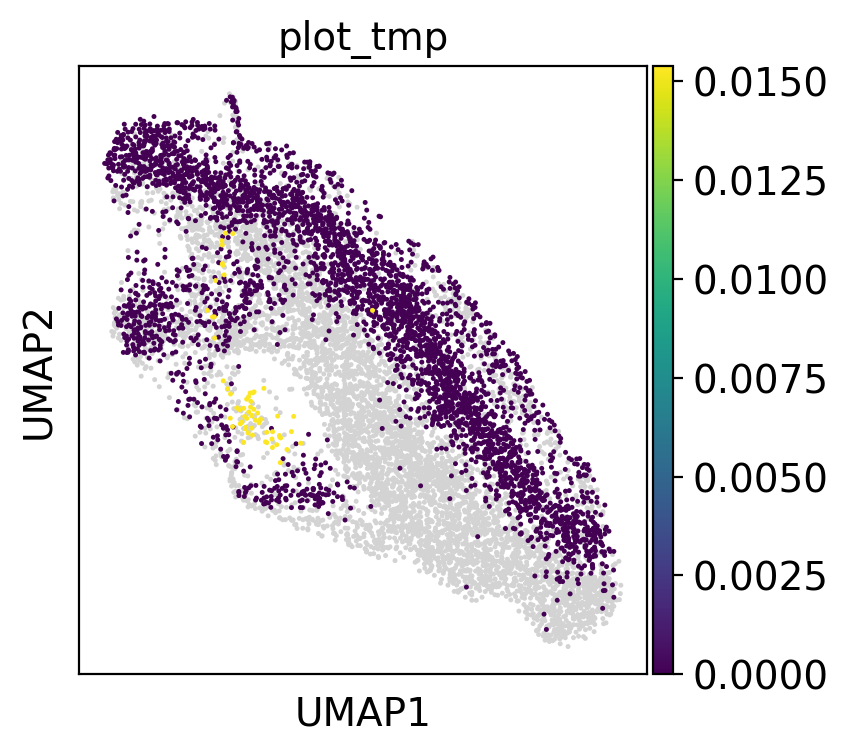

In [90]:
mpl.pull(tp0, time_points=[15.5])

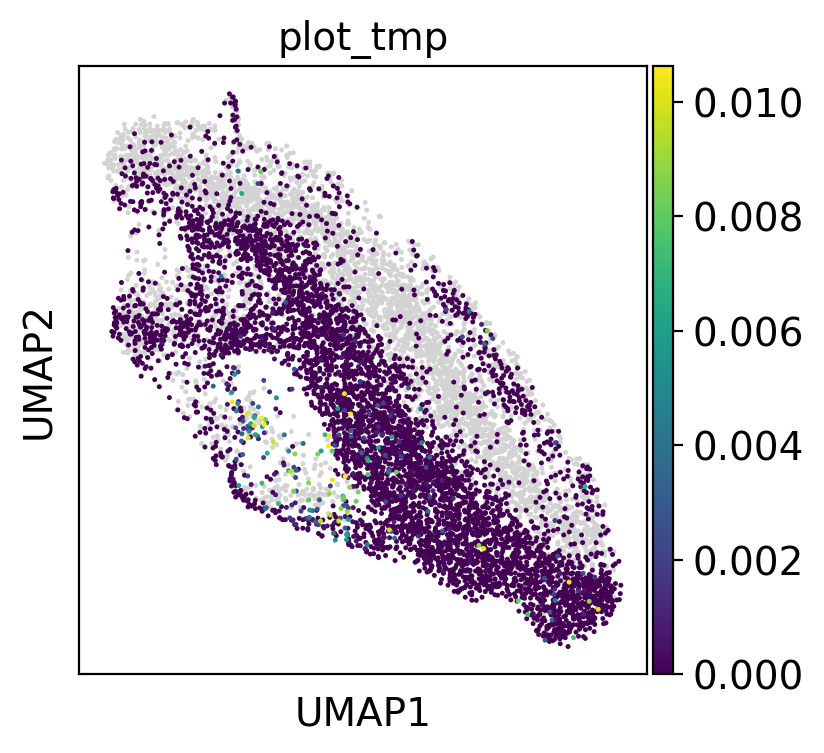

In [91]:
mpl.pull(tp0, time_points=[14.5])

In [134]:
tp0.push(14.5, 15.5, data="celltype_refined", subset="Fev+ Delta")

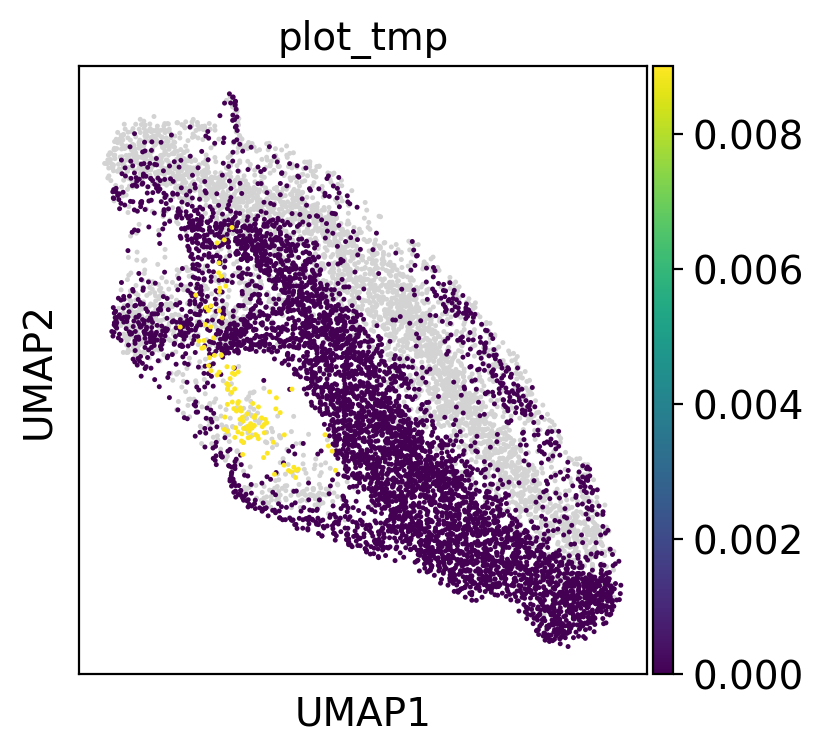

In [135]:
mpl.push(tp0, time_points=[14.5])

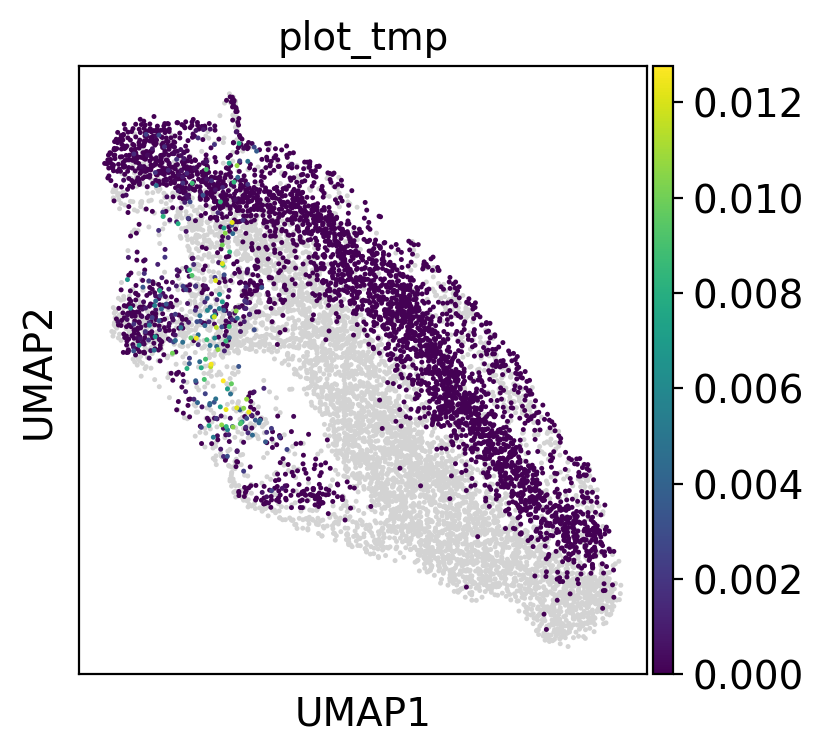

In [136]:
mpl.push(tp0, time_points=[15.5])

In [137]:
sc.tl.leiden(adata, restrict_to=("celltype_refined", ["Fev+ Delta"]), resolution=0.5, key_added="tmp_3")

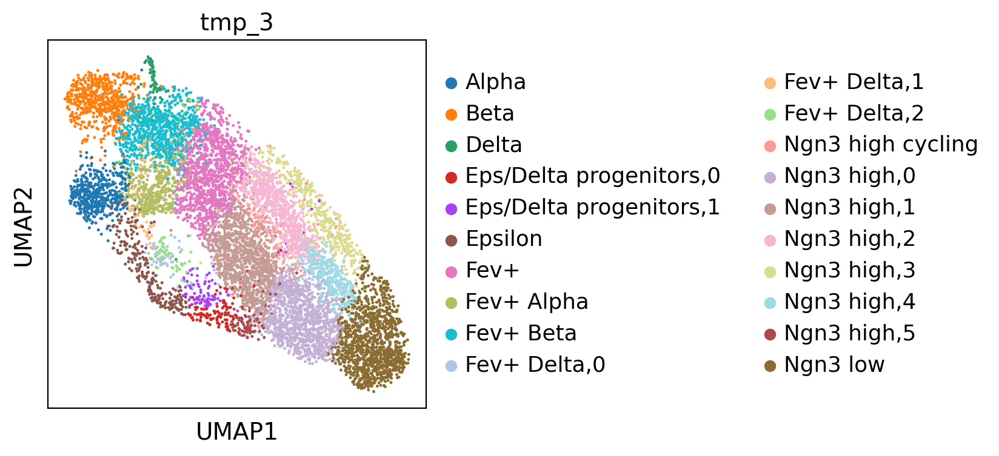

In [138]:
sc.pl.umap(adata, color="tmp_3")

In [139]:
tp1 = TemporalProblem(adata)
tp1 = tp0.prepare("time", joint_attr="X_multi_vi")
tp1 = tp0.solve(epsilon=1e-2, scale_cost="mean")

In [141]:
_ = tp1.cell_transition(14.5, 15.5, early_annotation="tmp_3", late_annotation="tmp_3", forward=True)

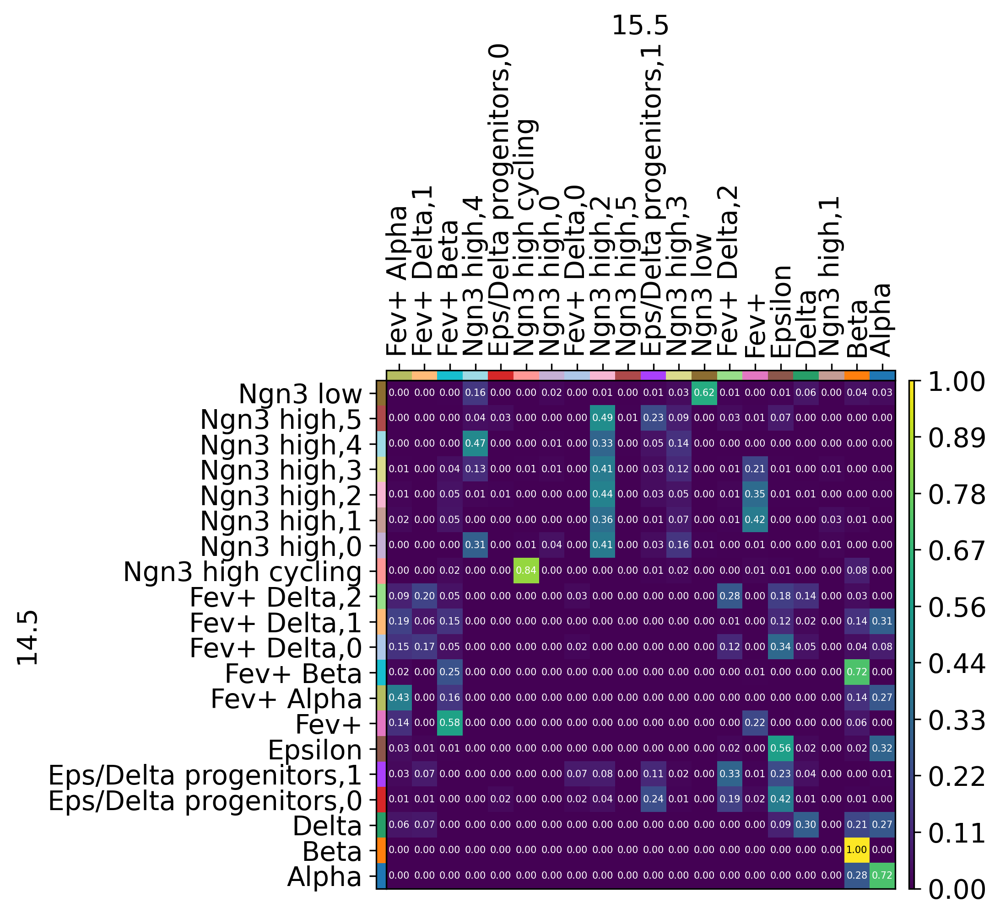

In [146]:
mpl.cell_transition(tp1, dpi=150, fontsize=5)

In [147]:
_ = tp1.cell_transition(14.5, 15.5, early_annotation="tmp_3", late_annotation="tmp_3", forward=False)

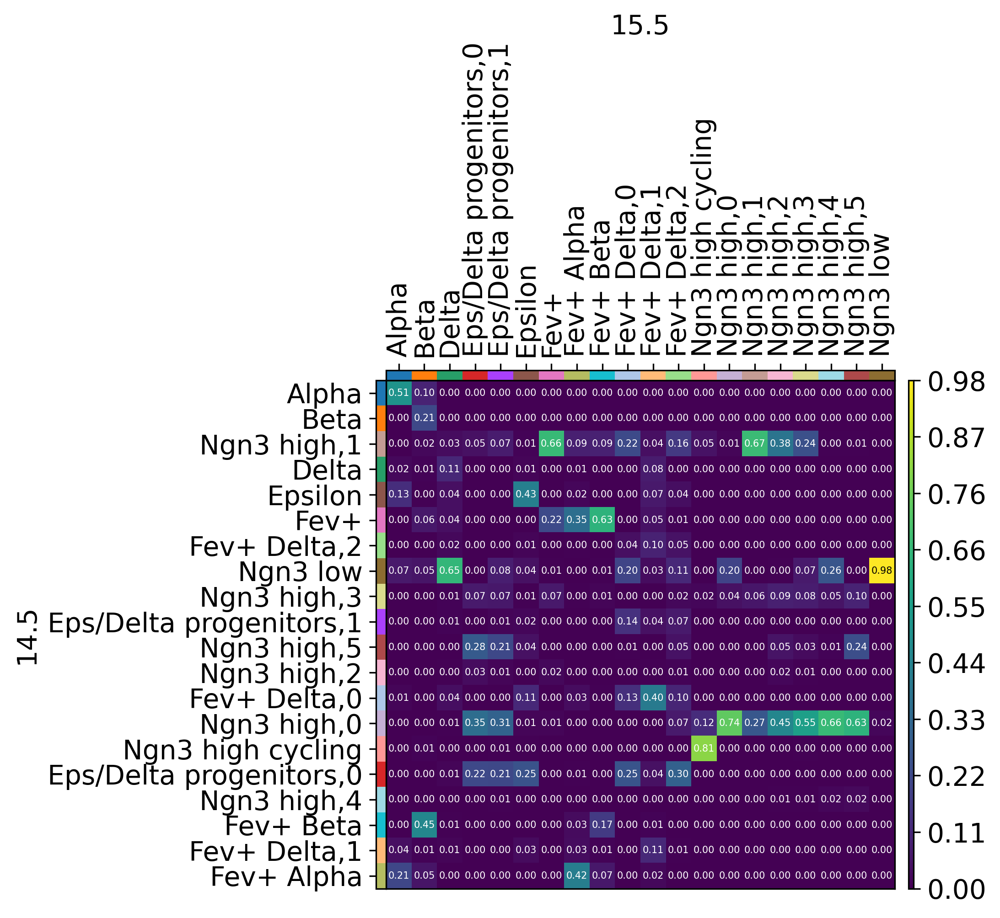

In [148]:
mpl.cell_transition(tp1, dpi=150, fontsize=5)

In [183]:
ct_to_keep = ["Fev+ Delta,0", "Fev+ Delta,1", "Fev+ Delta,2", "Eps/Delta progenitors,0", "Eps/Delta progenitors,1", "Epsilon", "Delta"]
adata_reduced_2 = adata[adata.obs["tmp_3"].isin(ct_to_keep)]

In [184]:
adata_reduced_2 = adata_reduced_2[:, adata_reduced_2.var["feature_type"]=="Gene Expression"]

In [185]:
genes_to_consider = ["Fev", "Hhex", "Gcg", "Sst", "Ghrl", "Pyy", "Ppy"]

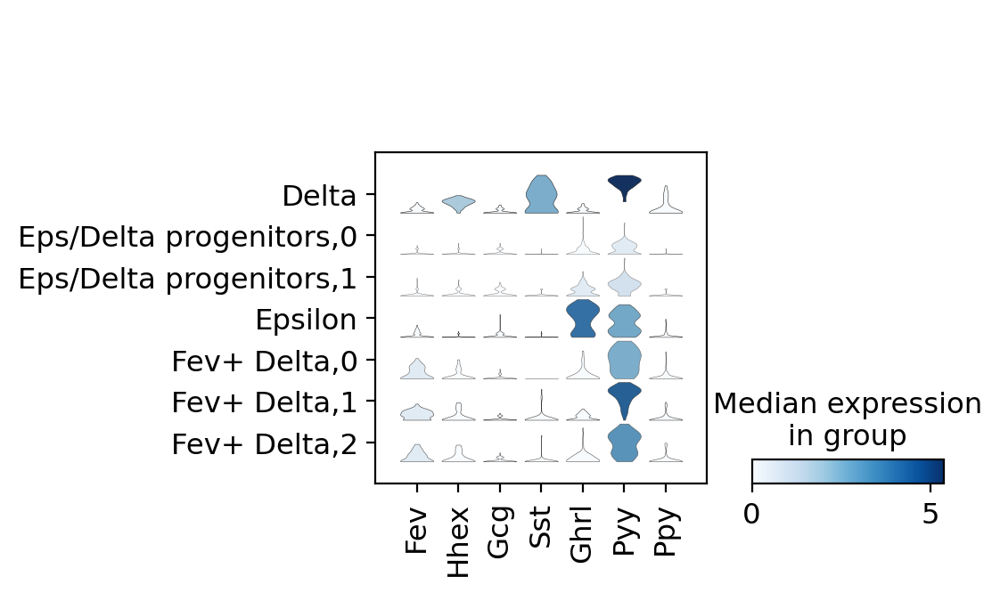

In [186]:
sc.pl.stacked_violin(adata_reduced_2, var_names=genes_to_consider, groupby="tmp_3")

In [187]:
fev_plus_eps = ['Tmem184c', 'Psmc2', 'Spint1', 'Ubl3', 'Sdcbp', 'Pclo', 'Lpcat3', 'Hpca', 'Cer1', 'Drap1', 'Lrrc42', 'Ppp3ca', 'Abhd15']

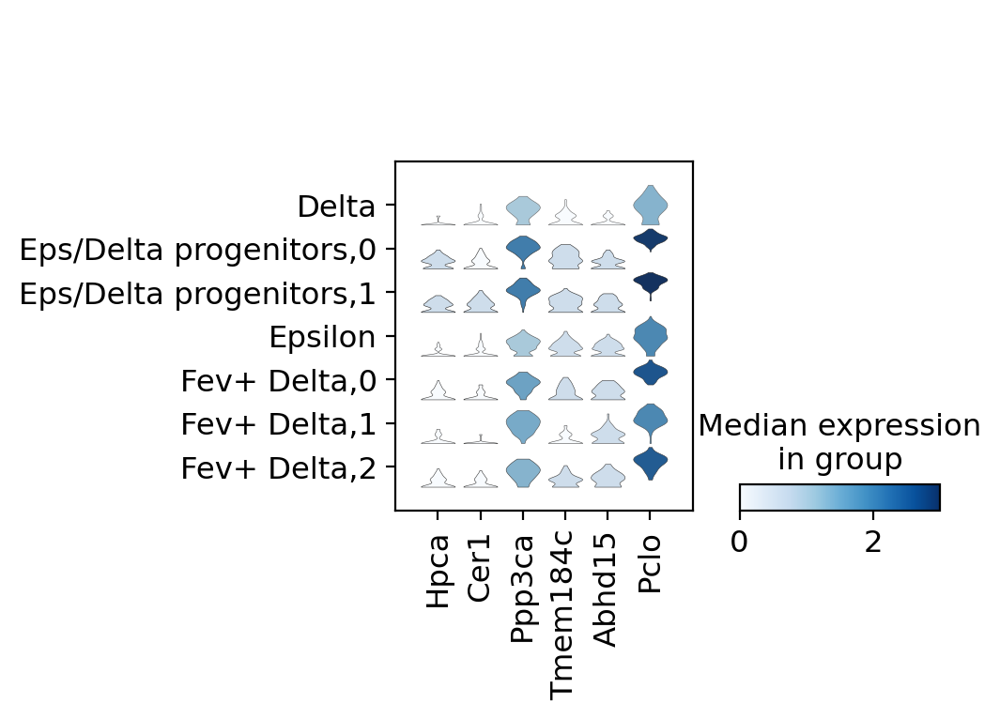

In [188]:
sc.pl.stacked_violin(adata_reduced_2, var_names=list(set(adata.var.index).intersection(set(fev_plus_eps))), groupby="tmp_3")

In [189]:
epsilon = ['Maged2', 'Txndc12', 'Prdx5', 'Cd164', 'Gng4', 'Pnmal2', 'Card19', 'Fam174a', 'Gm11837', 'Lrrtm3', 'Sin3b', 'Alcam', 'Ghrl', 'Lamp1', 'Fhl2', 'Anpep', 'Rbpms', 'Atraid', 'Ghrl', 'Maged2', 'Mboat4']

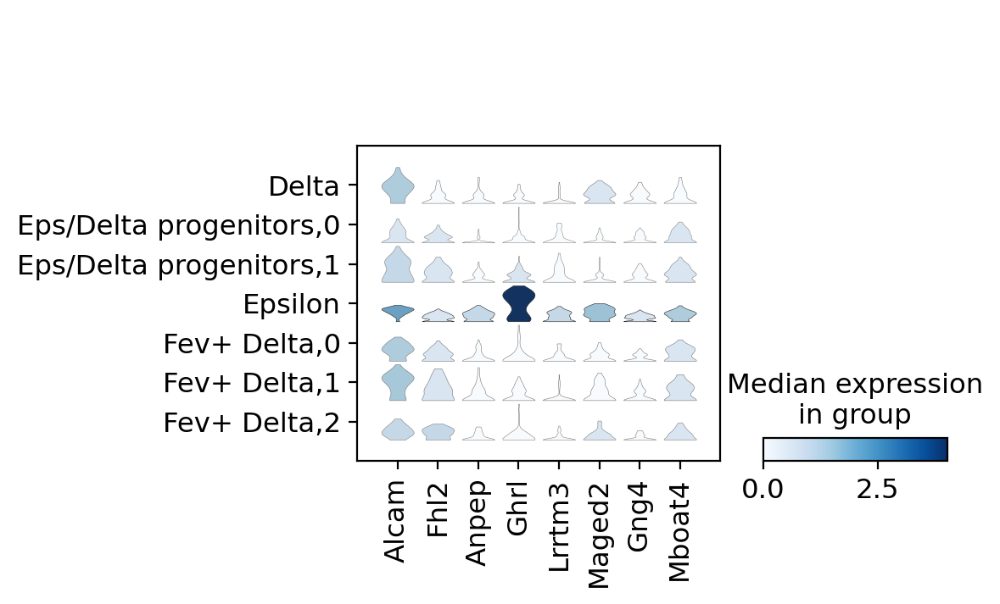

In [190]:
sc.pl.stacked_violin(adata_reduced_2, var_names=list(set(adata.var.index).intersection(set(epsilon))), groupby="tmp_3")

In [191]:
delta = ['Cd24a', 'Hhex', 'Pyy', 'Rbp4', 'Sst']

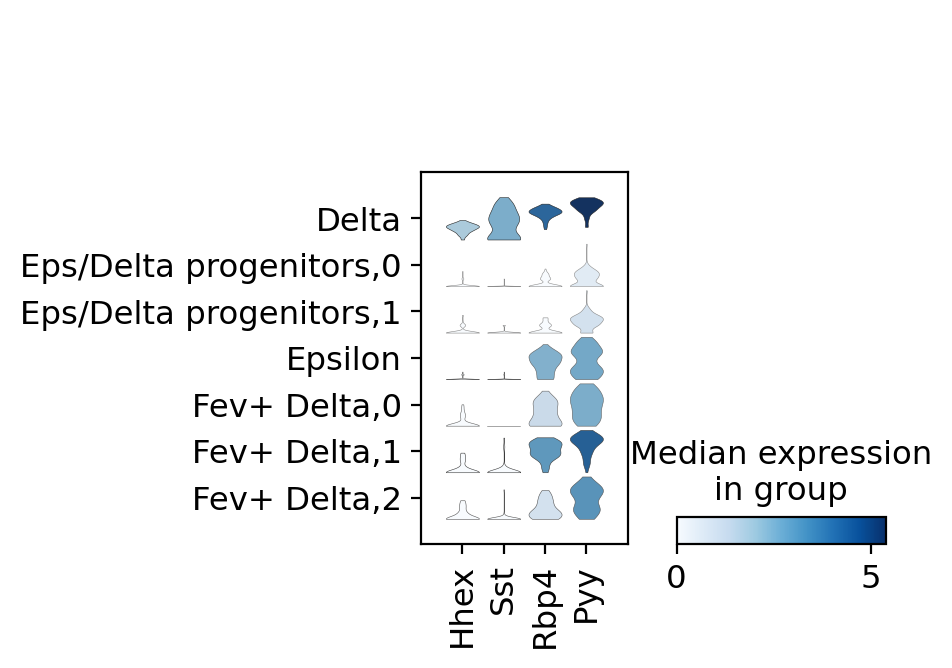

In [192]:
sc.pl.stacked_violin(adata_reduced_2, var_names=list(set(adata.var.index).intersection(set(delta))), groupby="tmp_3")

In [193]:
tp1.pull(14.5, 15.5, data="tmp_3", subset="Delta", key_added="delta_pull")

In [211]:
adata.obs["delta_pull_thresholded"] = adata.obs["delta_pull"] > np.percentile(adata.obs["delta_pull"], 98)

In [212]:
adata.obs["delta_pull_thresholded"] = adata.obs["delta_pull_thresholded"].astype(float)

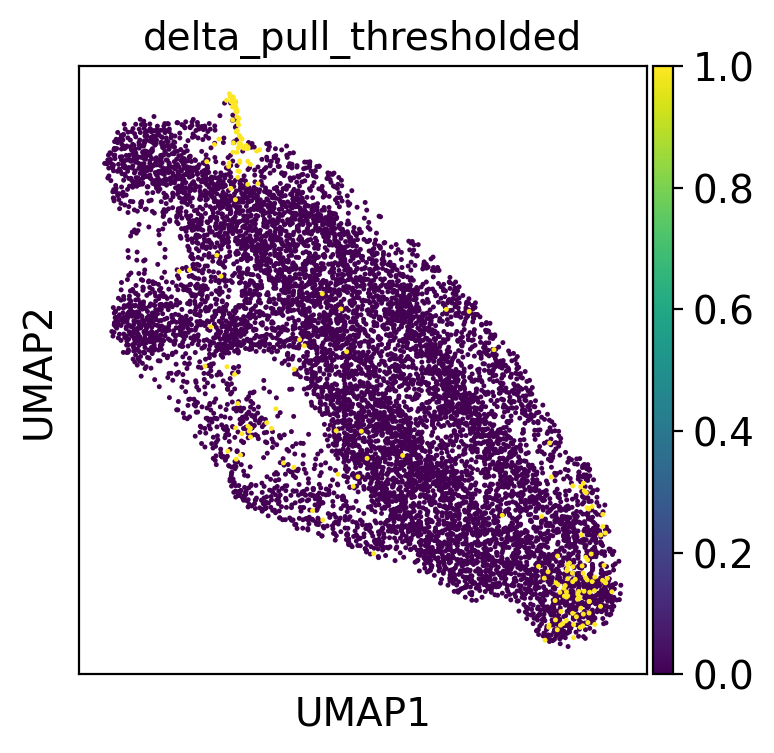

In [213]:
sc.pl.umap(adata, color="delta_pull_thresholded")

In [226]:
def helper2(x):
    if (x["celltype_refined"] == "Ngn3 low") and (x["delta_pull_thresholded"]==1):
        return "ngn3_low_pull"
    if (x["celltype_refined"] in ["Fev+ Delta"]) and (x["delta_pull_thresholded"]==1):
        return "fev_pos_pull"
    return x["celltype_refined"]

In [227]:
adata.obs["tmp_5"] = adata.obs.apply(helper2, axis=1)

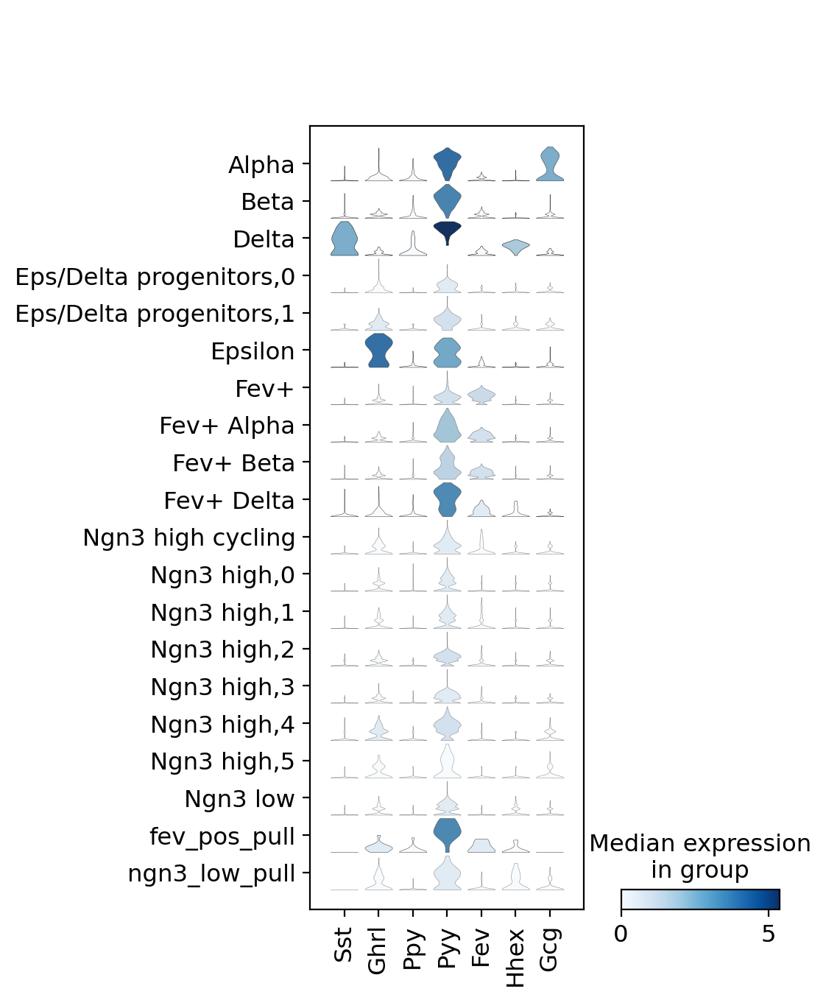

In [229]:
sc.pl.stacked_violin(adata, var_names=list(set(adata.var.index).intersection(set(genes_to_consider))), groupby="tmp_5")


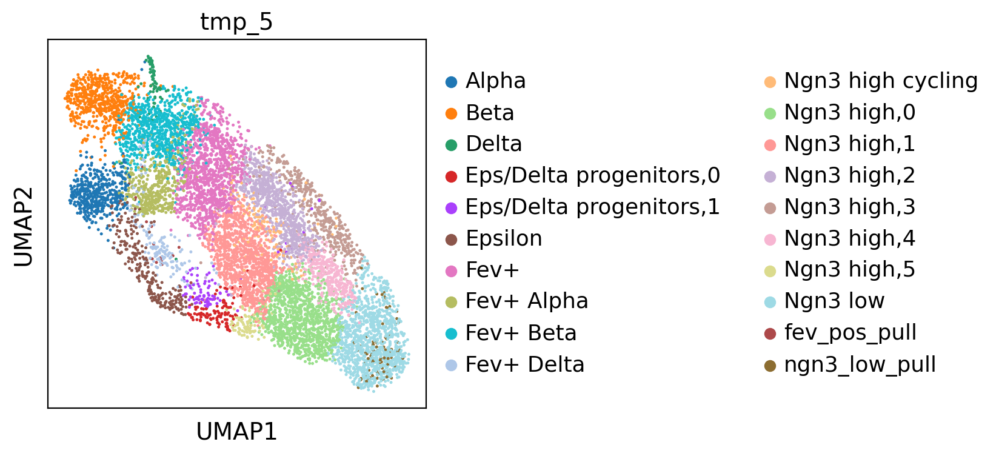

In [230]:
sc.pl.umap(adata, color="tmp_5")

In [232]:
adata.obs.to_csv("/lustre/groups/ml01/workspace/moscot_paper/pancreas/refined_annotation.csv")
